In [2]:
import pickle
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from distance_result import DistanceResult
from utils import get_pwdf_per_condition, get_melted_df_per_perturbation
from utils import get_flat_df, normalize_per_metric, get_distance_per_perturbation, add_rank_col
from utils import get_ranked_df_per_perturbation, calc_rank_percentile  # sensitivity plots
from utils import plt_legend

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

Global seed set to 0
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.


ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

To use sccoda or tasccoda please install ete3 with pip install ete3

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
%%time
with open('metric_runs_simulated2.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['100-pca-n_cells', '100-lognorm-n_cells', '100-counts-n_cells', '200-pca-n_cells', '200-lognorm-n_cells', '200-counts-n_cells', '300-pca-n_cells', '300-lognorm-n_cells', '300-counts-n_cells', '400-pca-n_cells', '400-lognorm-n_cells', '400-counts-n_cells', '500-pca-n_cells', '500-lognorm-n_cells', '500-counts-n_cells', '600-pca-n_cells', '600-lognorm-n_cells', '600-counts-n_cells', '10-lognorm-n_genes', '10-counts-n_genes', '10-pca-n_genes', '50-lognorm-n_genes', '50-counts-n_genes', '50-pca-n_genes', '100-lognorm-n_genes', '100-counts-n_genes', '100-pca-n_genes', '500-lognorm-n_genes', '500-counts-n_genes', '500-pca-n_genes', '1000-lognorm-n_genes', '1000-counts-n_genes', '1000-pca-n_genes', '2000-lognorm-n_genes', '2000-counts-n_genes', '2000-pca-n_genes', '5000-lognorm-n_genes', '5000-counts-n_genes', '5000-pca-n_genes', '10-lognorm-n_DEGs', '10-counts-n_DEGs', '20-lognorm-n_DEGs', '20-counts-n_DEGs', '30-lognorm-n_DEGs', '30-counts-n_DEGs', '40-lognorm-n_DEGs', '40-counts

In [5]:
metrics = list(results.values())[0].metrics
metrics

['euclidean',
 'spearman_distance',
 'mean_absolute_error',
 'r2_distance',
 'pearson_distance',
 'mse',
 'cosine_distance',
 'edistance',
 'mmd',
 'ks_test',
 't_test',
 'wasserstein',
 'classifier_proba',
 'kendalltau_distance',
 'jeffreys']

In [6]:
controls = ['control0', 'control1', 'control2', 'control3', 'control4']

In [7]:
# %load plotting_util.py
def plot(tags, plot=True):
    label_tag = tags[0]
    
    pwdfs = {}
    for k, res in results.items():
        if all(t in k for t in tags):
            pwdfs.update(res.pwdfs)
    
    if len(pwdfs) < 2:
        raise ValueError(f'Conditions {tags} were not run.')

    individually_ranked = get_ranked_df_per_perturbation(pwdfs, metrics, controls, label_tag)
    ctrl_ranks = calc_rank_percentile(individually_ranked, controls)

    if plot:
        melted_df = get_flat_df(pwdfs, controls, label=label_tag)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=normalize_per_metric(melted_df), x=label_tag, y='avg_dist', hue='metric')
        plt.ylabel('relative avg dist');
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'distance behavior w.r.t {label_tag} in {tags[1]} space')
        plt.show()

        ctrl_ranks[label_tag] = ctrl_ranks[label_tag].astype(float)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=ctrl_ranks, x=label_tag, y='rank', hue='metric')
        plt.ylabel('control rank percentile')
        plt.ylim(-.05, 1)
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'sensitivity w.r.t. {label_tag} in {tags[1]} space')
        plt.show()
    
    return pwdfs, ctrl_ranks


## n_cells

Calculate and visualize change in distance due to sample size.

In [9]:
pwdfs

{'euclidean-100': perturbation     Path10     Path11     Path12     Path13     Path14  \
 control0      10.114891  10.477441  10.484648  12.897157  10.127498   
 control1      10.055372  10.455899  10.201503  12.557590  10.234450   
 control2      10.097647  10.735222  10.616813  12.694684   9.878415   
 control3      10.101859  10.495399  10.398792  13.250627  10.006902   
 control4       9.762323  10.609658  10.604672  13.121333  10.293955   
 
 perturbation     Path15     Path16     Path17     Path18     Path19  ...  \
 control0      10.543019  10.146224  11.433558  12.054146  18.145002  ...   
 control1      10.211461  10.116503  10.801980  12.045300  17.825727  ...   
 control2      10.239843  10.101962  11.615471  12.249057  19.105274  ...   
 control3      10.079267  10.268094  11.157159  11.817715  18.002234  ...   
 control4      10.491713  10.399050  11.272496  12.348498  18.227350  ...   
 
 perturbation      Path5      Path6      Path7      Path8      Path9  control0  \
 co

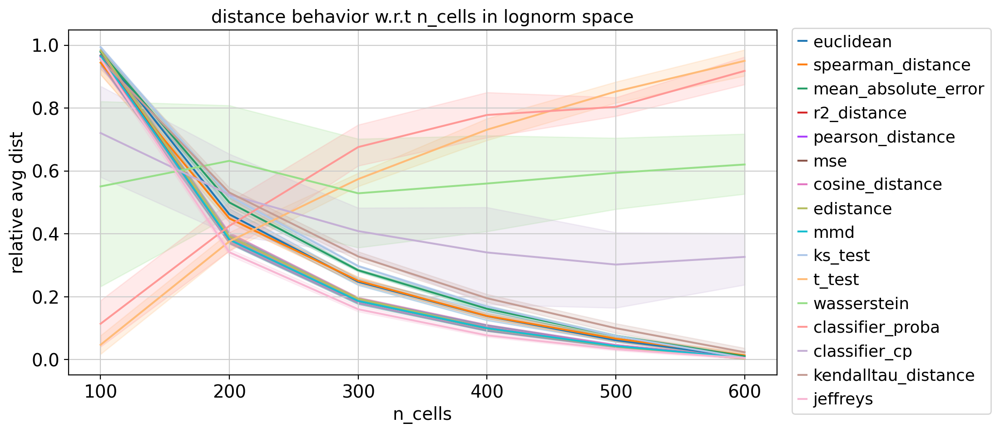

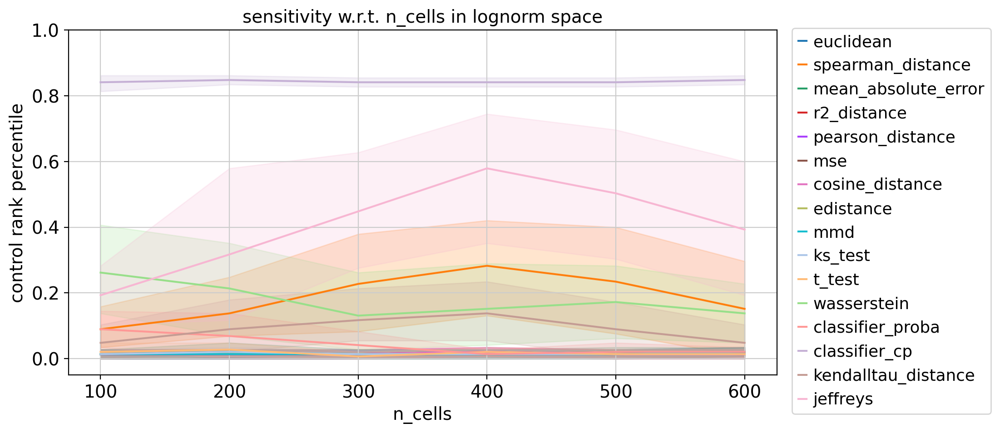

In [8]:
pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm'])

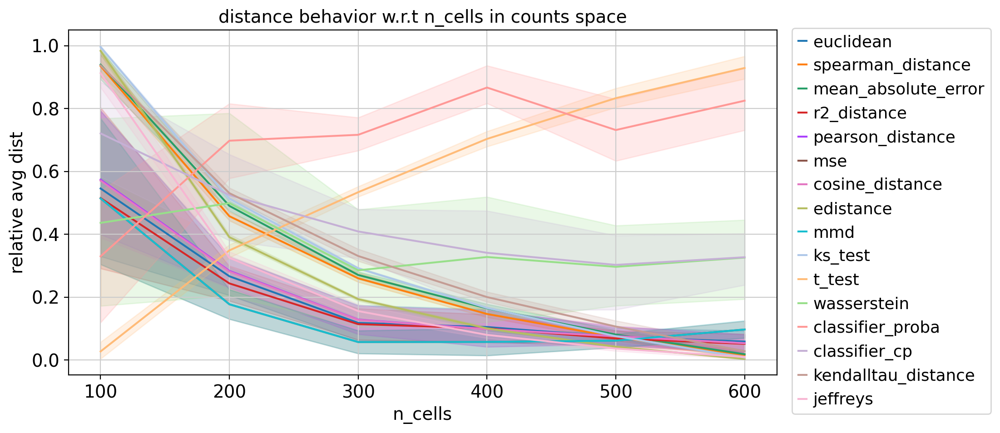

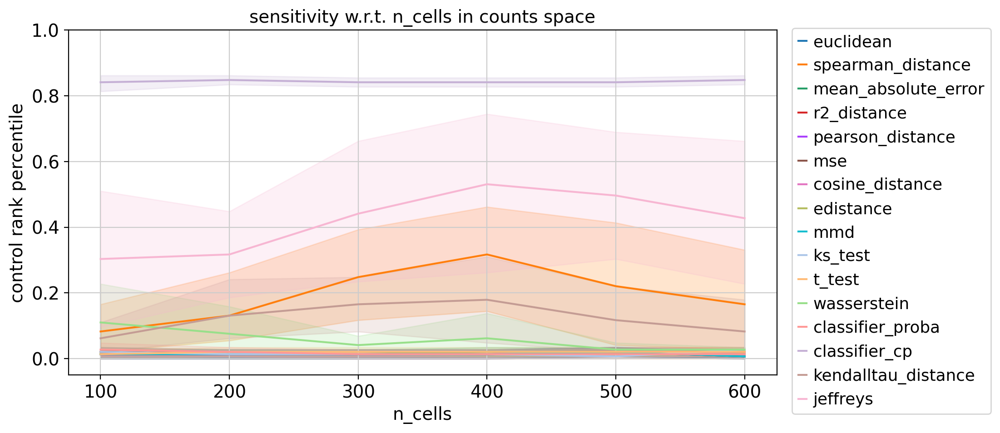

In [8]:
pwdfs, ctrl_ranks = plot(['n_cells', 'counts'])

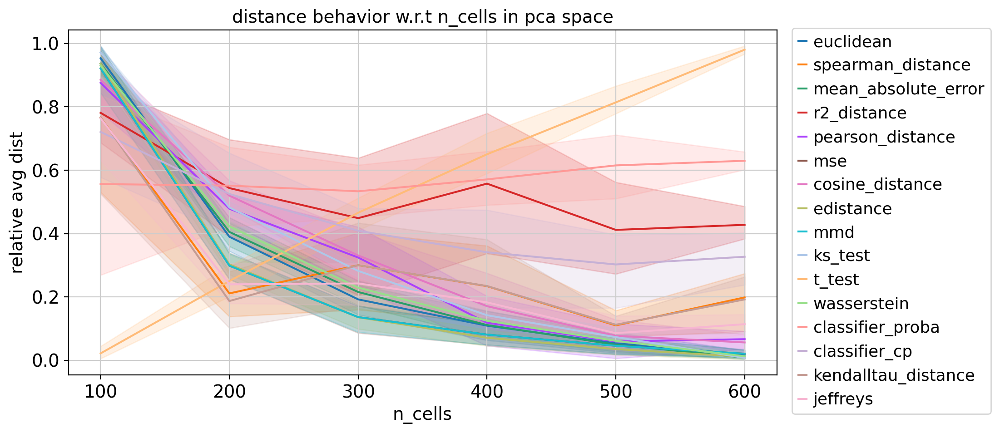

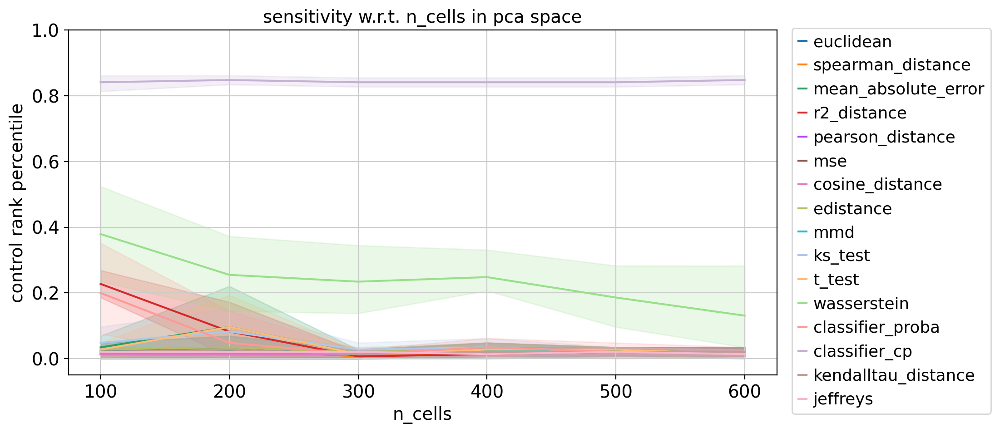

In [9]:
pwdfs, ctrl_ranks = plot(['n_cells', 'pca'])

## n highly variable genes

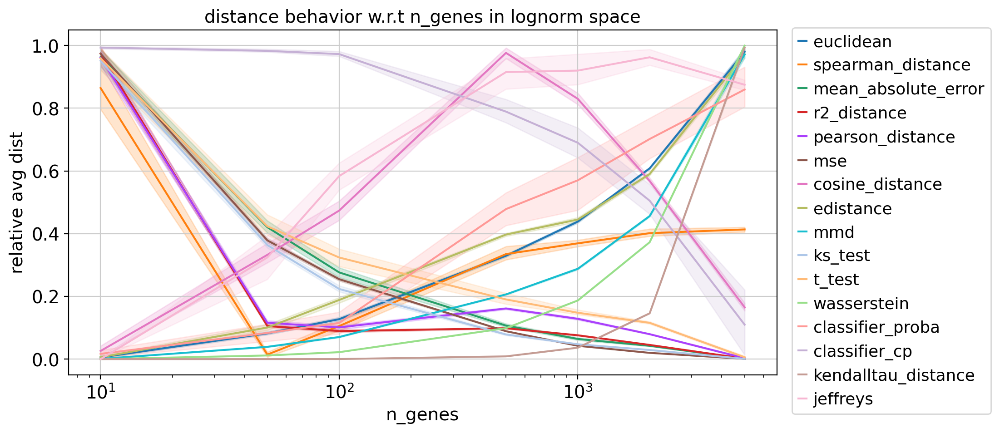

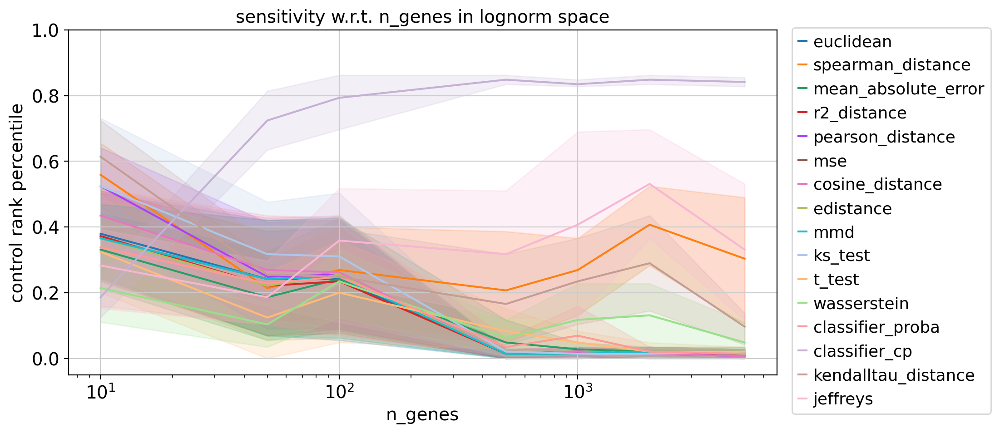

In [10]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'])

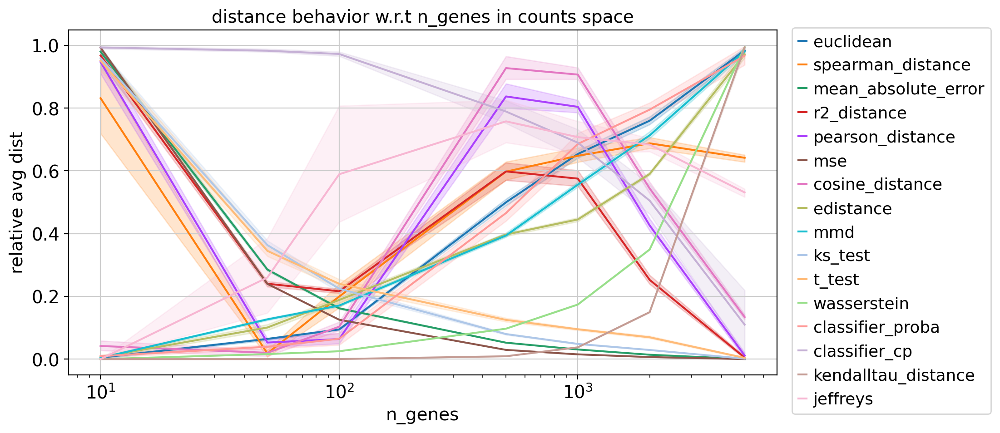

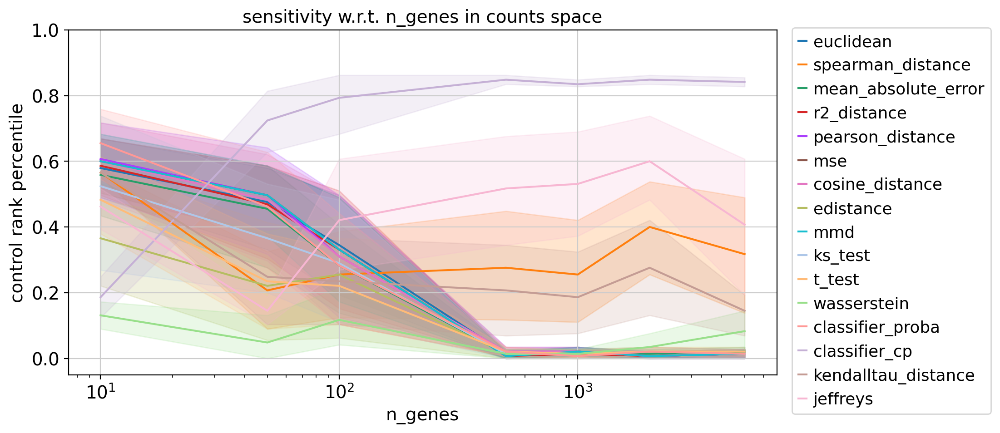

In [11]:
pwdfs, ctrl_ranks = plot(['n_genes', 'counts'])

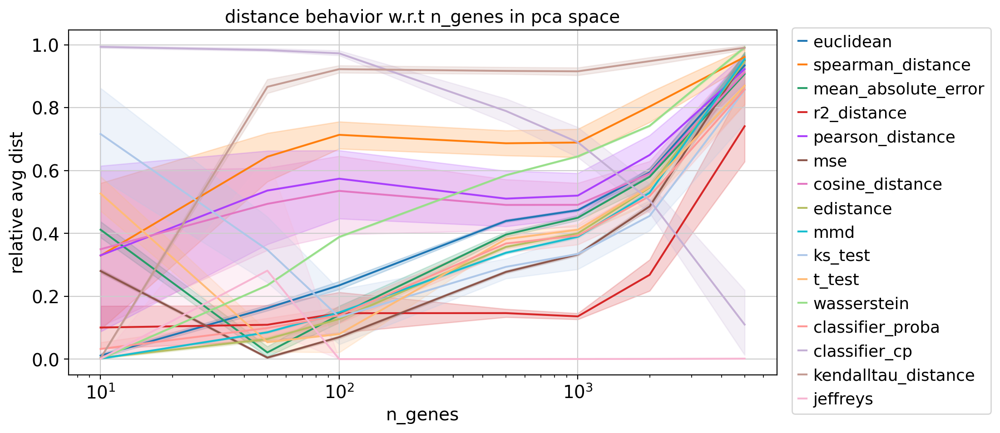

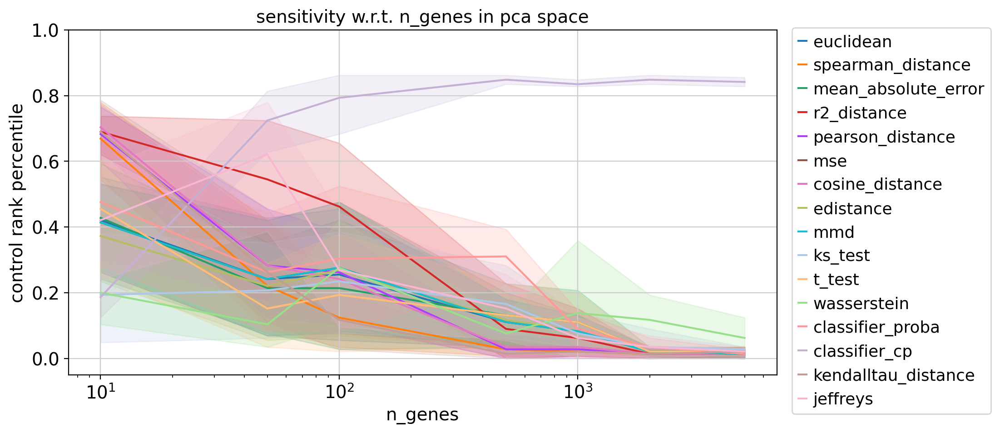

In [12]:
pwdfs, ctrl_ranks = plot(['n_genes', 'pca'])

## n differentially expressed genes

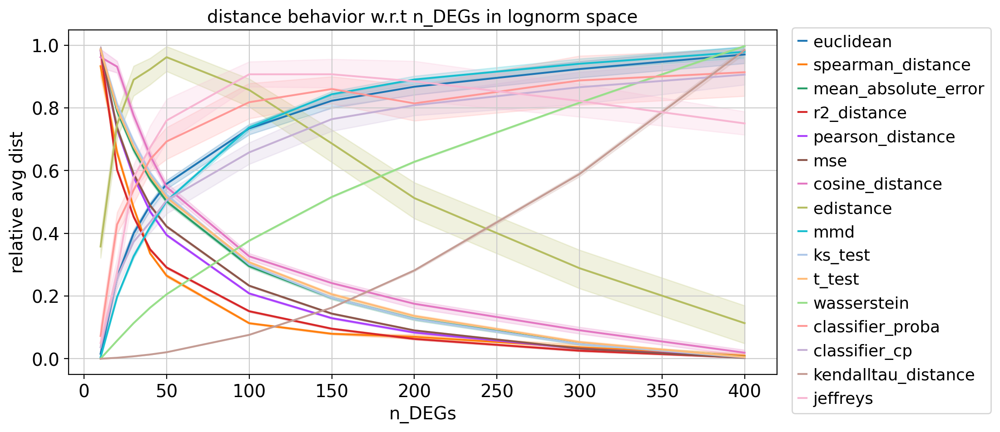

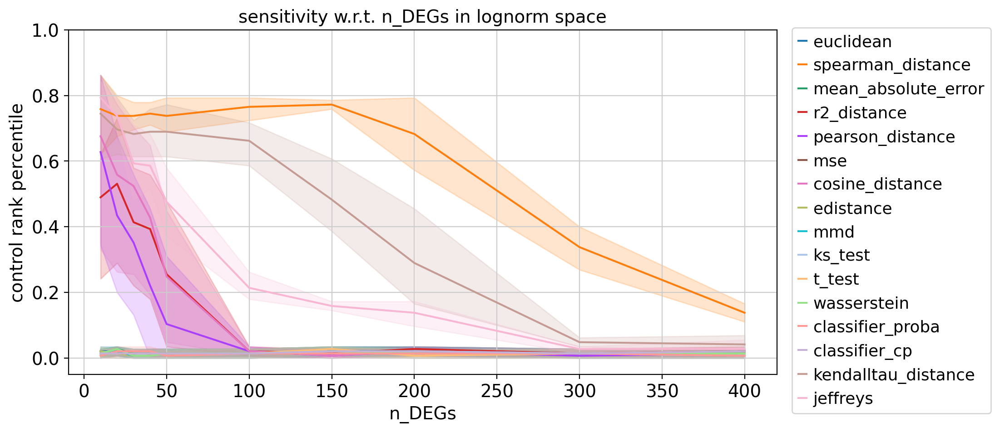

In [13]:
pwdfs, ctrl_ranks = plot(['n_DEGs', 'lognorm'])

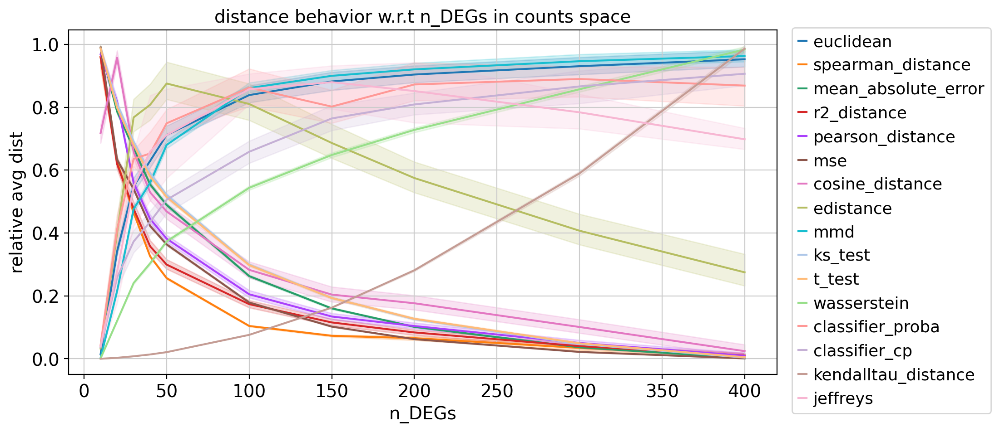

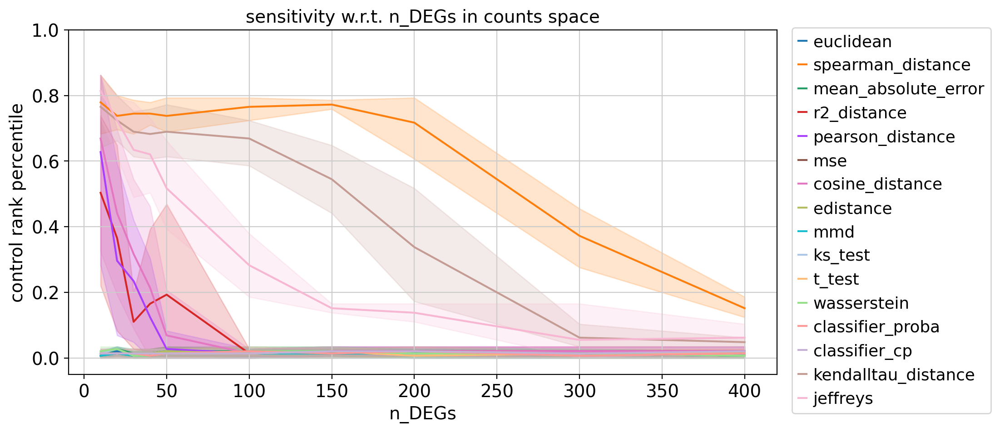

In [14]:
pwdfs, ctrl_ranks = plot(['n_DEGs', 'counts'])

## percent control contamination

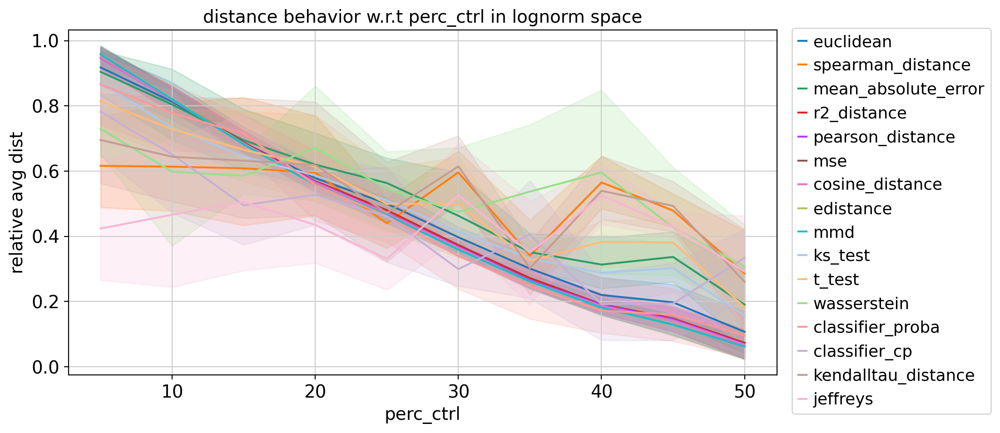

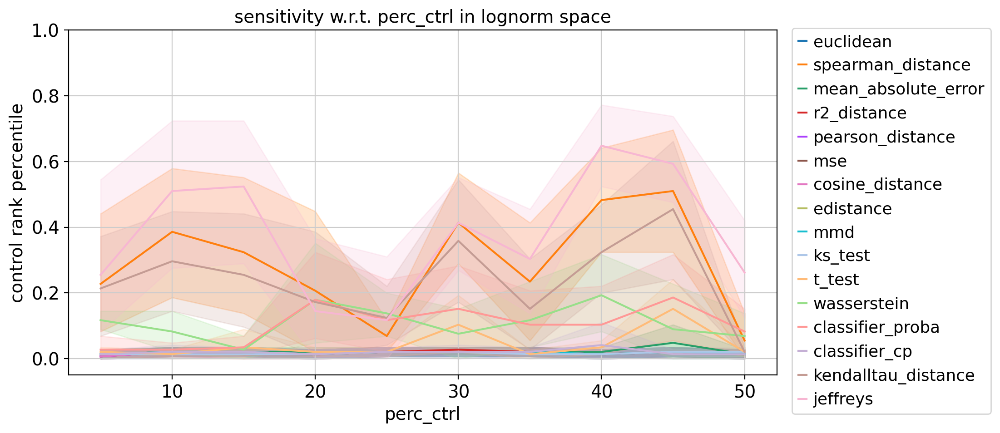

In [15]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'lognorm'])

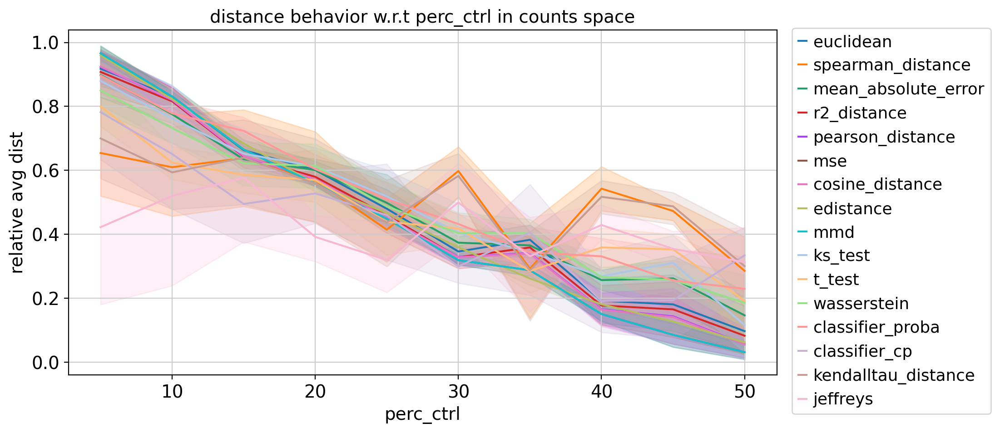

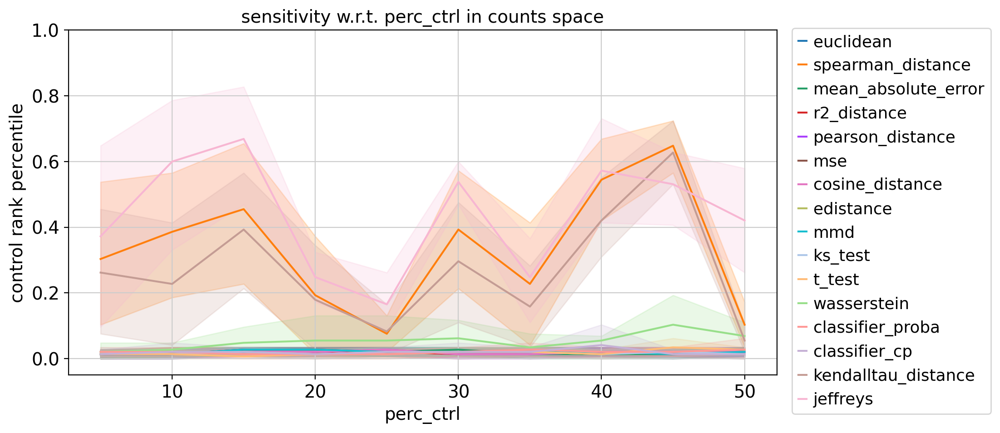

In [16]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'counts'])

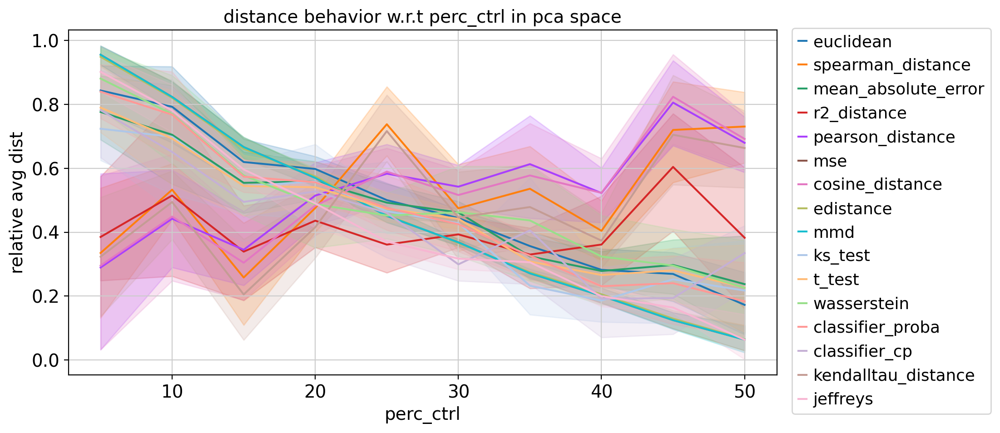

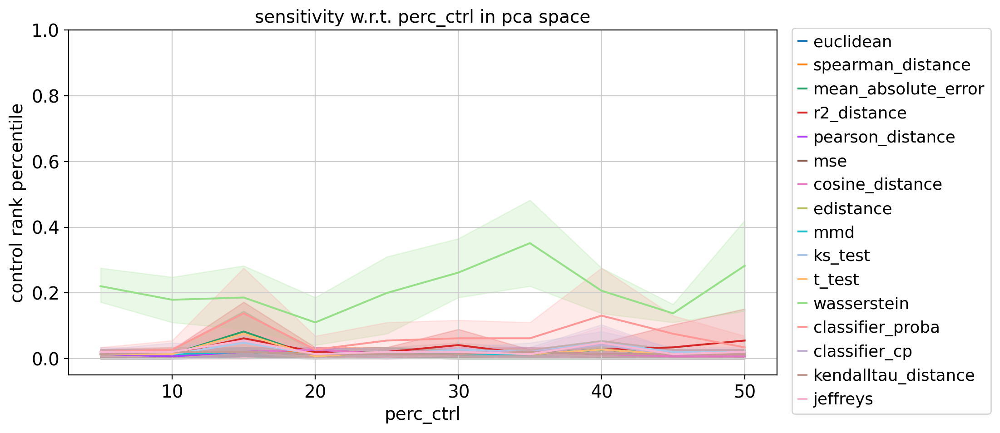

In [17]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'pca'])

## library size

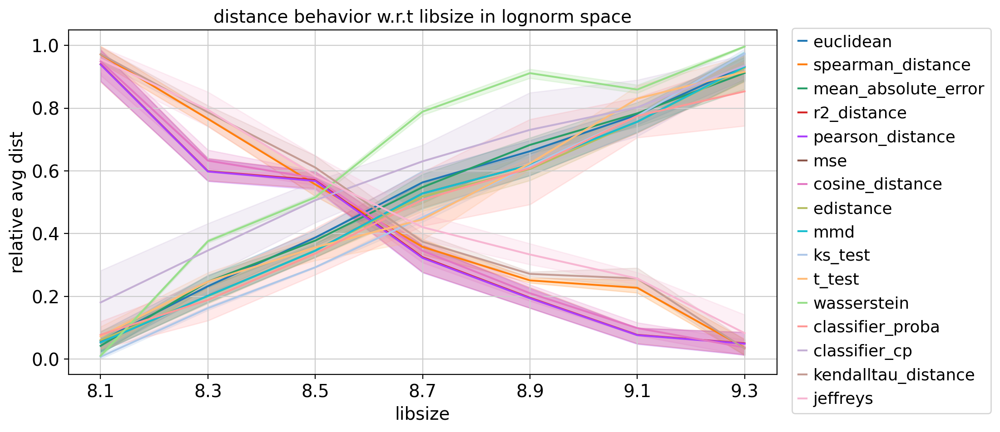

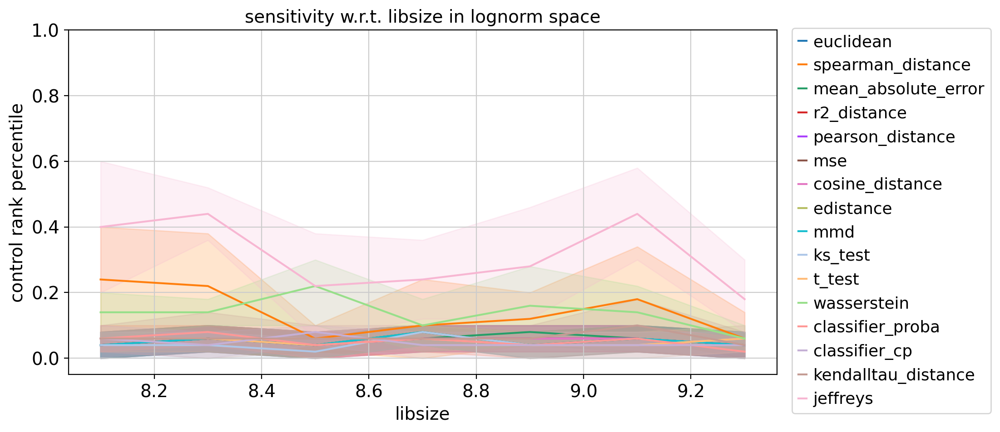

In [18]:
pwdfs, ctrl_ranks = plot(['libsize', 'lognorm'])

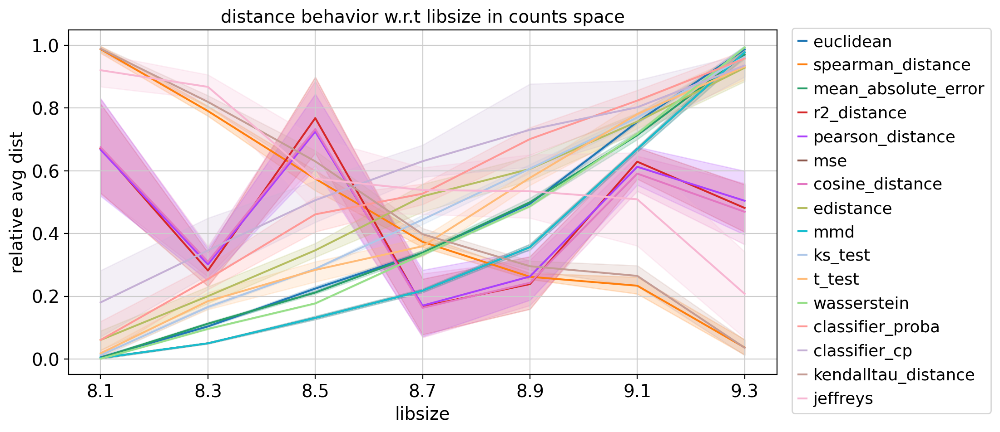

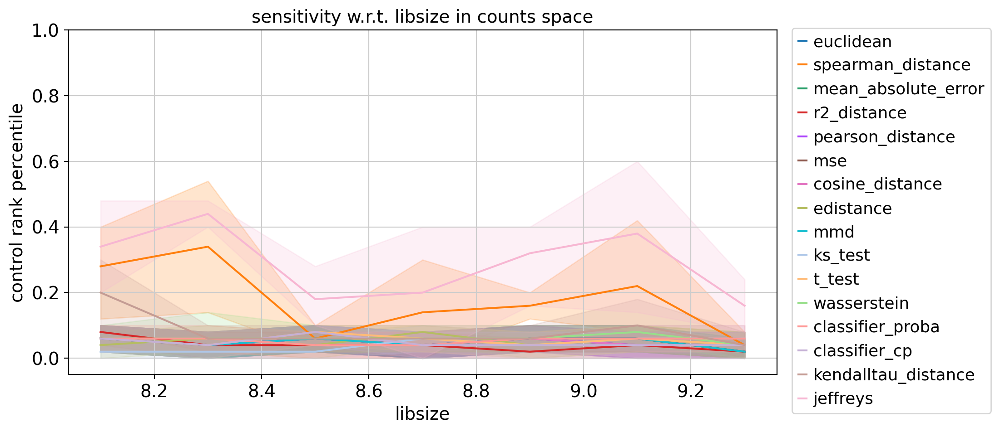

In [19]:
pwdfs, ctrl_ranks = plot(['libsize', 'counts'])

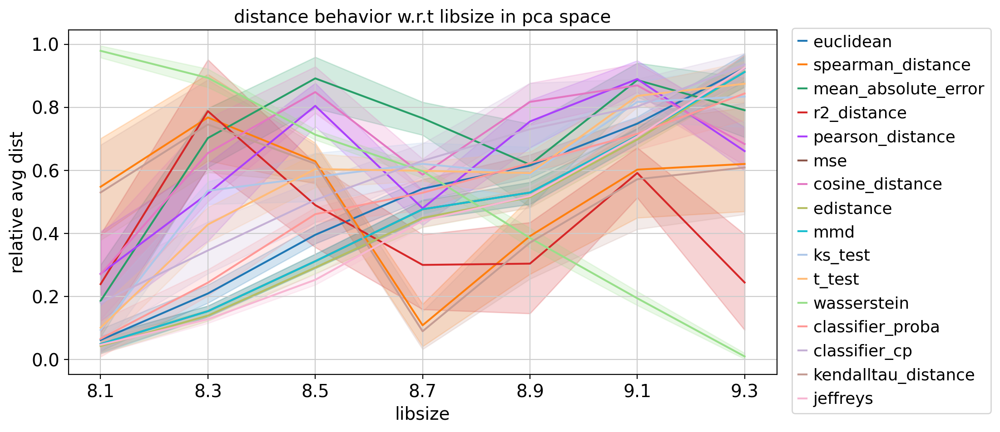

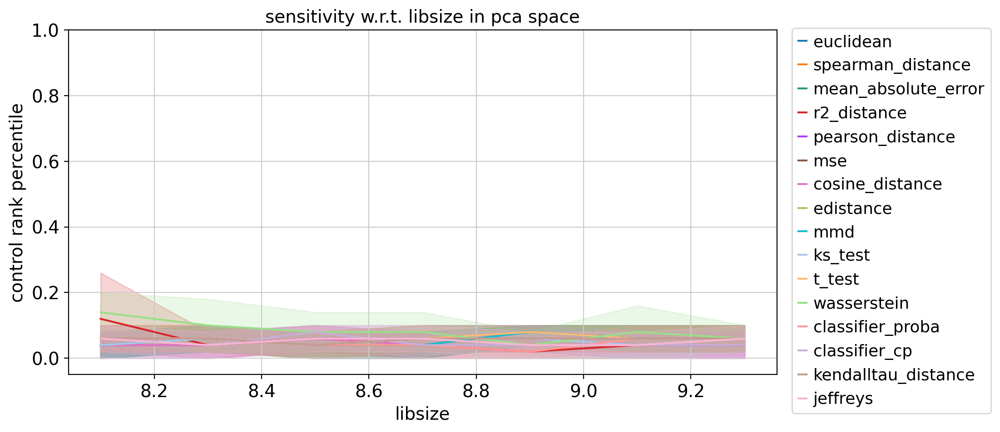

In [20]:
pwdfs, ctrl_ranks = plot(['libsize', 'pca'])

## between metric correlation (old)

In [120]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df, params):
    # annotate
    for col in params.columns:
        df[col] = df.index.map(dict(zip(params.perturbation, params[col])))

In [121]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'], plot=False)
df = pd.concat([pwdfs[f'{metric}-2000'].loc[['control0']] for metric in metrics]).T
df.columns = metrics
annotate(df, params)
df = df.dropna()

In [118]:
df.corr(method='spearman')

,t_test,kl_divergence,cosine_distance,euclidean,pearson_distance,wasserstein,edistance,mse,mmd,spearman_distance,mean_absolute_error,r2_distance,index,Prob,DEProb,DownProb,FacLoc,FacScale,Steps,Skew
t_test,1.000000,-0.022609,0.919130,0.912174,0.919130,0.655652,0.915851,0.912174,0.912174,0.866957,0.946087,0.923478,0.457391,NaN,0.690809,NaN,0.296110,0.296110,NaN,NaN
kl_divergence,-0.022609,1.000000,-0.103478,-0.103478,-0.103478,-0.066957,-0.105675,-0.103478,-0.103478,0.331304,-0.034783,-0.104348,0.184348,NaN,0.007049,NaN,0.188434,0.188434,NaN,NaN
cosine_distance,0.919130,-0.103478,1.000000,0.998261,1.000000,0.607826,0.998043,0.998261,0.998261,0.764348,0.879130,0.999130,0.507826,NaN,0.726055,NaN,0.339181,0.339181,NaN,NaN
euclidean,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
pearson_distance,0.919130,-0.103478,1.000000,0.998261,1.000000,0.607826,0.998043,0.998261,0.998261,0.764348,0.879130,0.999130,0.507826,NaN,0.726055,NaN,0.339181,0.339181,NaN,NaN
wasserstein,0.655652,-0.066957,0.607826,0.613043,0.607826,1.000000,0.613612,0.613043,0.613043,0.504348,0.712174,0.619130,0.593913,NaN,0.546303,NaN,0.473776,0.473776,NaN,NaN
edistance,0.915851,-0.105675,0.998043,0.999783,0.998043,0.613612,1.000000,0.999783,0.999783,0.758426,0.867580,0.997173,0.490976,NaN,0.731500,NaN,0.320407,0.320407,NaN,NaN
mse,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
mmd,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
spearman_distance,0.866957,0.331304,0.764348,0.754783,0.764348,0.504348,0.758426,0.754783,0.754783,1.000000,0.808696,0.766957,0.487826,NaN,0.581549,NaN,0.355332,0.355332,NaN,NaN


Correlation between winners and runner ups:

In [131]:
def corr_plot(col1, col2, **kwargs):
    sns.scatterplot(data=df, x=col1, y=col2, **kwargs)
    corr = spearmanr(df[col1].values, df[col2].values)[0]
    plt.title(f'corr={corr:.3f}')
    plt.xscale('log')
    plt.yscale('log')
    plt_legend()

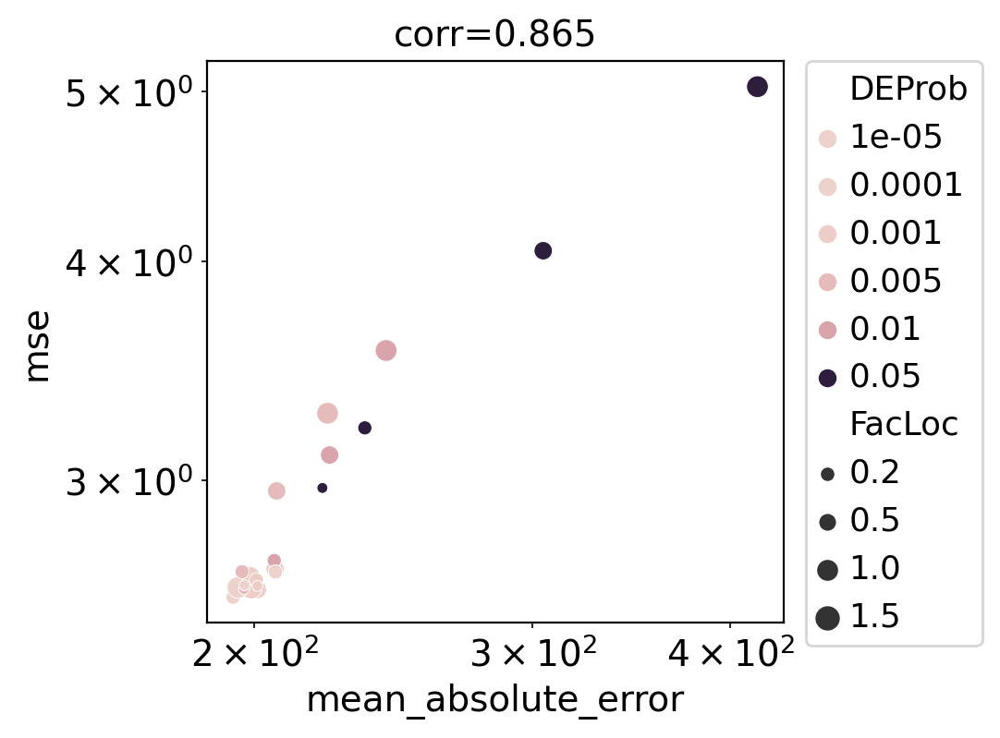

In [132]:
corr_plot('mean_absolute_error', 'mse', hue='DEProb', size='FacLoc')